<a href="https://colab.research.google.com/github/dhruvii-i/Fraud-Detection-in-ecommerce/blob/main/Fraud_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Fraud_data contains information of individual transactions for the time period of 1 month (May 2015) that are classified as fradulent (1) or legitimate (0).

The data spans sign-up time for time period May 1, 2015 - August 18, 2015 (3.5 months approx) and purchase time for time period May 1, 2015 - December 16, 2015 (7.5 months).

Ip_address provides ranges of ip_addresses corresponding to different countries.

# Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

import timeit

%matplotlib inline
sns.set_style("dark")

from sklearn.naive_bayes import MultinomialNB, BernoulliNB
from sklearn import svm
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import precision_score, recall_score, f1_score,make_scorer,confusion_matrix

# LOAD THE DATA

In [2]:
fraud = pd.read_csv('/content/Fraud_Data.csv')
ip_add = pd.read_csv('/content/IpAddress_to_Country.csv')

In [3]:
ip_add.head()

,lower_bound_ip_address,upper_bound_ip_address,country
0,16777216.0,16777471,Australia
1,16777472.0,16777727,China
2,16777728.0,16778239,China
3,16778240.0,16779263,Australia
4,16779264.0,16781311,China


In [4]:
fraud.head()

,user_id,signup_time,purchase_time,purchase_value,device_id,source,browser,sex,age,ip_address,class
0,22058,2015-02-24 22:55:49,2015-04-18 02:47:11,34,QVPSPJUOCKZAR,SEO,Chrome,M,39,7.327584e+08,0
1,333320,2015-06-07 20:39:50,2015-06-08 01:38:54,16,EOGFQPIZPYXFZ,Ads,Chrome,F,53,3.503114e+08,0
2,1359,2015-01-01 18:52:44,2015-01-01 18:52:45,15,YSSKYOSJHPPLJ,SEO,Opera,M,53,2.621474e+09,1
3,150084,2015-04-28 21:13:25,2015-05-04 13:54:50,44,ATGTXKYKUDUQN,SEO,Safari,M,41,3.840542e+09,0
4,221365,2015-07-21 07:09:52,2015-09-09 18:40:53,39,NAUITBZFJKHWW,Ads,Safari,M,45,4.155831e+08,0


In [5]:
fraud.shape

(151112, 11)

In [6]:
len(ip_add['country'].unique())

235

# Data Visualising and Analysis

In [7]:
fraud.isna().sum()

user_id           0
signup_time       0
purchase_time     0
purchase_value    0
device_id         0
source            0
browser           0
sex               0
age               0
ip_address        0
class             0
dtype: int64

<Axes: xlabel='source', ylabel='count'>

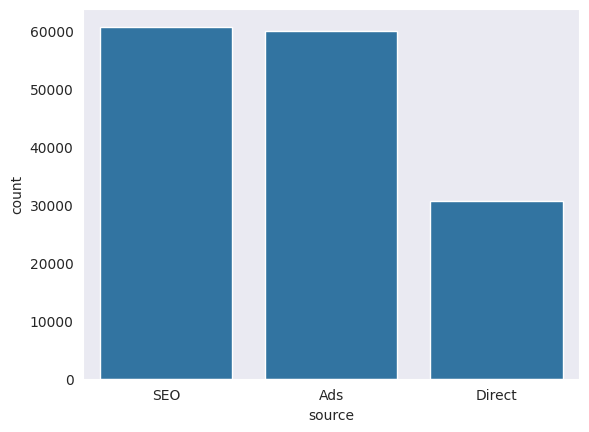

In [8]:
sns.countplot(x='source', data=fraud)

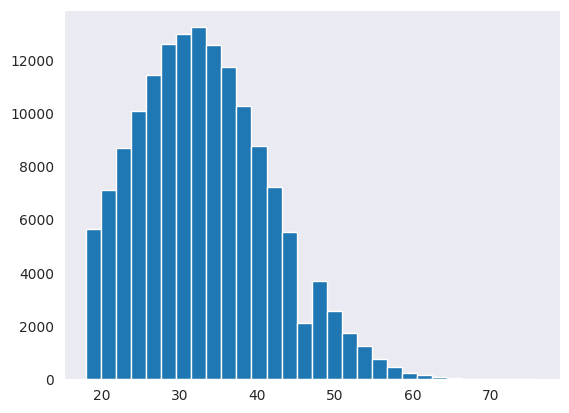

In [9]:
plt.hist(fraud['age'],bins=30);

In [10]:
fraud.describe()

,user_id,purchase_value,age,ip_address,class
count,151112.000000,151112.000000,151112.000000,1.511120e+05,151112.000000
mean,200171.040970,36.935372,33.140704,2.152145e+09,0.093646
std,115369.285024,18.322762,8.617733,1.248497e+09,0.291336
min,2.000000,9.000000,18.000000,5.209350e+04,0.000000
25%,100642.500000,22.000000,27.000000,1.085934e+09,0.000000
50%,199958.000000,35.000000,33.000000,2.154770e+09,0.000000
75%,300054.000000,49.000000,39.000000,3.243258e+09,0.000000
max,400000.000000,154.000000,76.000000,4.294850e+09,1.000000


In [11]:
len(fraud.index.unique())

151112

In [12]:
dist = fraud['class'].value_counts()
print(dist)
print('The normal class is',round(dist[0]/dist[1],1),'times more than the fraud class')

0    136961
1     14151
Name: class, dtype: int64
The normal class is 9.7 times more than the fraud class


In [13]:
fraud.shape

(151112, 11)

<Axes: xlabel='browser', ylabel='count'>

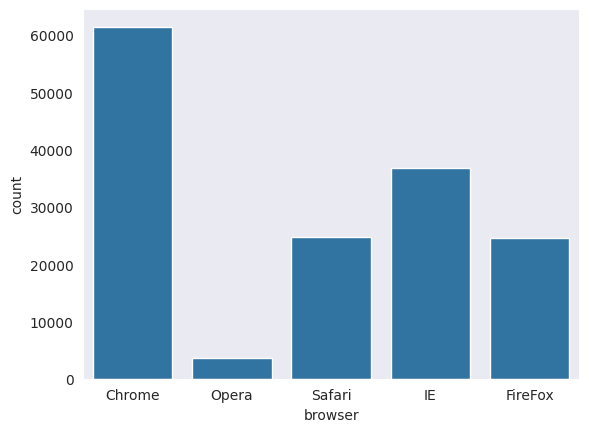

In [14]:
sns.countplot(x='browser', data=fraud)

<Axes: xlabel='sex', ylabel='count'>

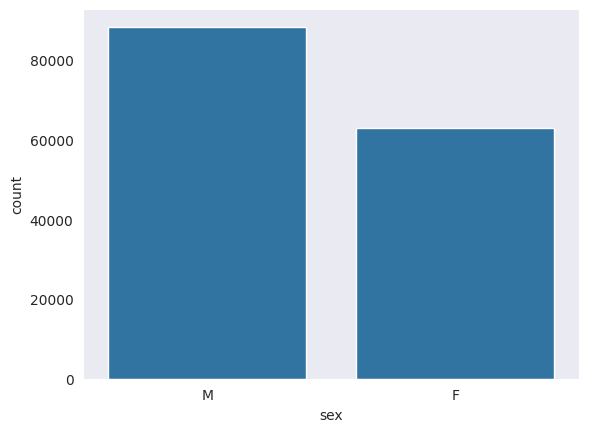

In [35]:
sns.countplot(x='sex', data=fraud)

<ipython-input-16-7901b52513f2>:2: UserWarning: FixedFormatter should only be used together with FixedLocator
  p1.set_xticklabels(p1.get_xticklabels(), rotation=90)


[Text(0, 0, '18'),
 Text(1, 0, '19'),
 Text(2, 0, '20'),
 Text(3, 0, '21'),
 Text(4, 0, '22'),
 Text(5, 0, '23'),
 Text(6, 0, '24'),
 Text(7, 0, '25'),
 Text(8, 0, '26'),
 Text(9, 0, '27'),
 Text(10, 0, '28'),
 Text(11, 0, '29'),
 Text(12, 0, '30'),
 Text(13, 0, '31'),
 Text(14, 0, '32'),
 Text(15, 0, '33'),
 Text(16, 0, '34'),
 Text(17, 0, '35'),
 Text(18, 0, '36'),
 Text(19, 0, '37'),
 Text(20, 0, '38'),
 Text(21, 0, '39'),
 Text(22, 0, '40'),
 Text(23, 0, '41'),
 Text(24, 0, '42'),
 Text(25, 0, '43'),
 Text(26, 0, '44'),
 Text(27, 0, '45'),
 Text(28, 0, '46'),
 Text(29, 0, '47'),
 Text(30, 0, '48'),
 Text(31, 0, '49'),
 Text(32, 0, '50'),
 Text(33, 0, '51'),
 Text(34, 0, '52'),
 Text(35, 0, '53'),
 Text(36, 0, '54'),
 Text(37, 0, '55'),
 Text(38, 0, '56'),
 Text(39, 0, '57'),
 Text(40, 0, '58'),
 Text(41, 0, '59'),
 Text(42, 0, '60'),
 Text(43, 0, '61'),
 Text(44, 0, '62'),
 Text(45, 0, '63'),
 Text(46, 0, '64'),
 Text(47, 0, '65'),
 Text(48, 0, '66'),
 Text(49, 0, '67'),
 Text(50, 

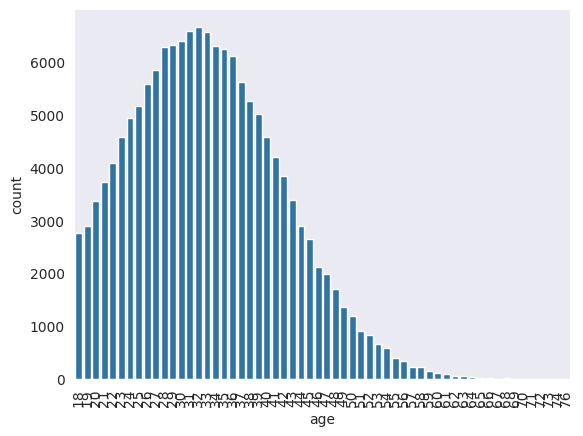

In [16]:
p1 = sns.countplot(x='age', data=fraud )
p1.set_xticklabels(p1.get_xticklabels(), rotation=90)

In [17]:
fraud['class'].value_counts()

0    136961
1     14151
Name: class, dtype: int64

<ipython-input-18-9e1b4130a7fe>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(fraud['purchase_value'], bins=50)


<Axes: xlabel='purchase_value', ylabel='Density'>

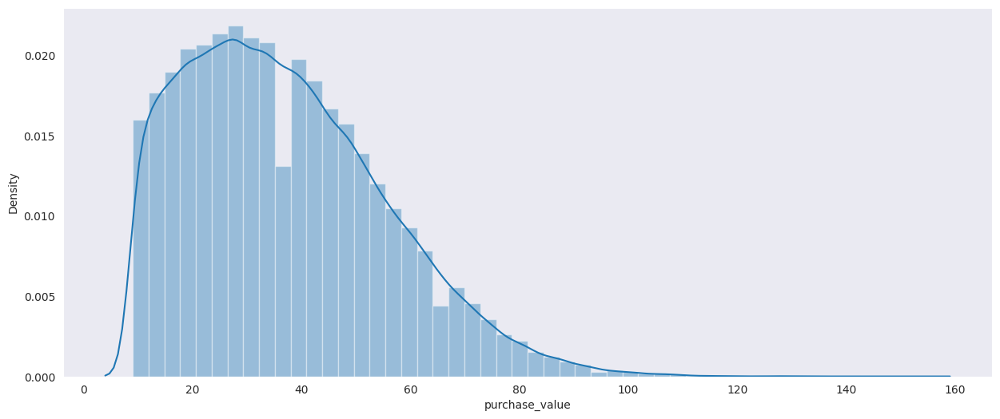

In [18]:
plt.figure(figsize=(15, 6))
sns.distplot(fraud['purchase_value'], bins=50)

<ipython-input-19-7d6024a46bfc>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(fraud.corr(),


<Axes: >

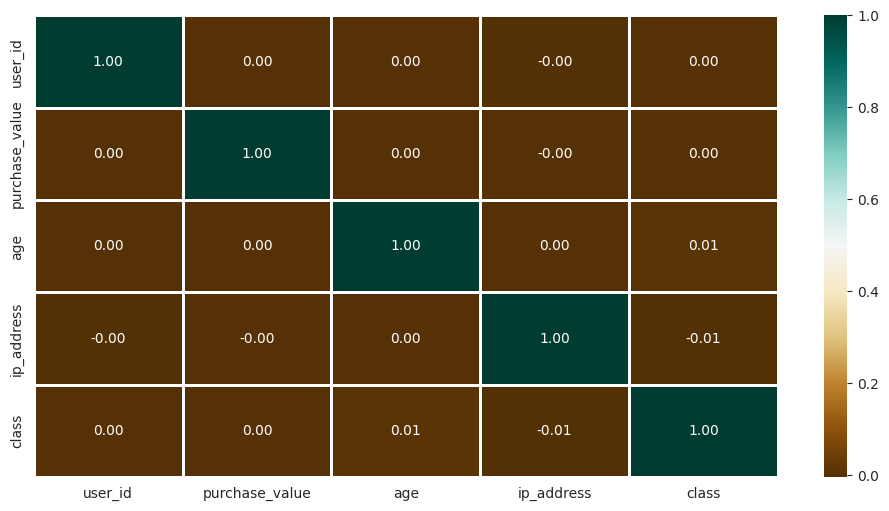

In [19]:
plt.figure(figsize=(12, 6))
sns.heatmap(fraud.corr(),
            cmap='BrBG',
            fmt='.2f',
            linewidths=2,
            annot=True)

# Plot the Relationship between Signup time, Purchase Time and whether the transaction was fraudulent or not

In [21]:
fraud['signup_time'] = pd.to_datetime(fraud['signup_time'])
fraud['purchase_time'] = pd.to_datetime(fraud['purchase_time'])

In [22]:
fraud['signup_time'].min(), fraud['signup_time'].max()

(Timestamp('2015-01-01 00:00:42'), Timestamp('2015-08-18 04:40:29'))

In [23]:
fraud['purchase_time'].min(), fraud['purchase_time'].max()

(Timestamp('2015-01-01 00:00:44'), Timestamp('2015-12-16 02:56:05'))

In [24]:
import plotly.express as px

fig = px.histogram(
    fraud,
    x=[fraud['signup_time'][fraud['class'] == 1], fraud['purchase_time'][fraud['class'] == 1]],
    marginal='rug',
    nbins=30,
    opacity=0.7,
    labels={'x': 'Time'},
    template='plotly_dark',
    color_discrete_sequence=['blue', 'orange'],
    category_orders={'class': [1]},
    facet_col=fraud['class'][fraud['class'] == 1],
)

fig.update_layout(
    title_text="Frequencies of Signup & Purchase Time for Fraudulent Transactions",
    title_font_size=16,
    xaxis_title="Time",
    yaxis_title="Frequency",
)

fig.show()


In [25]:
fig = px.histogram(
    fraud,
    x=[fraud['signup_time'][fraud['class'] == 0], fraud['purchase_time'][fraud['class'] == 0]],
    marginal='rug',
    nbins=30,
    opacity=0.7,
    labels={'x': 'Time'},
    template='plotly_dark',
    color_discrete_sequence=['green', 'red'],
    category_orders={'class': [0]},
    facet_col=fraud['class'][fraud['class'] == 0],
)

fig.update_layout(
    title_text="Frequencies of Signup & Purchase Time for Non Fraudalent Transactions",
    title_font_size=16,
    xaxis_title="Time",
    yaxis_title="Frequency",
)

fig.show()


Fraudulent transaction vs Legitimate Browser

In [26]:
def fraud_no_fraud_chart(col):
    df1 = pd.DataFrame(fraud[fraud['class']==1].groupby(col).count())
    df0 = pd.DataFrame(fraud[fraud['class']==0].groupby(col).count())

    fig = px.bar(
        df1,
        x=df1.index.unique(),
        y='class',
        title=f"{col.capitalize()} for Fraudulent Transactions",
        labels={'class': 'Frequency', 'x': col.capitalize()},
        template='plotly_dark',
    )

    fig2 = px.bar(
        df0,
        x=df0.index.unique(),
        y='class',
        title=f"{col.capitalize()} for Legitimate Transactions",
        labels={'class': 'Frequency', 'x': col.capitalize()},
        template='plotly_dark',
    )

    fig.show()
    fig2.show()
fraud_no_fraud_chart('browser')


In [27]:
fraud_no_fraud_chart('source')

In [28]:
fraud_no_fraud_chart('sex')

In [29]:
fraud_no_fraud_chart('age')

## RELATIONSHIP BETWEEN COUNTRIES AND FRAUDELENT TRANSACTIONS

In [31]:
def country_map(ip_ad):
    countries=ip_add.loc[(ip_add['upper_bound_ip_address'] >= ip_ad) & (ip_add['lower_bound_ip_address'] <= ip_ad),'country'].values

    if len(countries)==0:
        return np.nan
    return countries[0]

In [32]:
fraud['country'] = fraud['ip_address'].apply(lambda row: country_map(row))

In [33]:
fraud.head()

,user_id,signup_time,purchase_time,purchase_value,device_id,source,browser,sex,age,ip_address,class,country
0,22058,2015-02-24 22:55:49,2015-04-18 02:47:11,34,QVPSPJUOCKZAR,SEO,Chrome,M,39,7.327584e+08,0,Japan
1,333320,2015-06-07 20:39:50,2015-06-08 01:38:54,16,EOGFQPIZPYXFZ,Ads,Chrome,F,53,3.503114e+08,0,United States
2,1359,2015-01-01 18:52:44,2015-01-01 18:52:45,15,YSSKYOSJHPPLJ,SEO,Opera,M,53,2.621474e+09,1,United States
3,150084,2015-04-28 21:13:25,2015-05-04 13:54:50,44,ATGTXKYKUDUQN,SEO,Safari,M,41,3.840542e+09,0,NaN
4,221365,2015-07-21 07:09:52,2015-09-09 18:40:53,39,NAUITBZFJKHWW,Ads,Safari,M,45,4.155831e+08,0,United States


In [54]:
fraud_with_country = fraud.to_csv('fraud_w_country.csv')

In [37]:
fraud['country'].isna().sum()

21966

In [39]:
#Total Transactions
totals_by_country = fraud[['country','class']].groupby('country').count().sort_values('class',ascending=False)


#Fraudulent Transactions by country
fraud_by_country = fraud[['country','class']][fraud['class']==1].groupby('country').count().sort_values('class',ascending=False)
fraud_by_country.reset_index(inplace=True)

rate_df = pd.DataFrame(totals_by_country)
rate_df.reset_index(inplace=True)
rate_df2 = rate_df.merge(fraud_by_country,on='country')
rate_df2['ratio'] = rate_df2['class_y']/rate_df2['class_x']
rate_df2.rename(columns={'class_x':'total_transactions','class_y':'total_fraudulent'},inplace=True)
#Countries sorted by ratio of fraudulent transactions
rate_df3 = rate_df2[rate_df2['ratio']>=.10].sort_values('ratio',ascending=False)


<ipython-input-48-3c4ca73be0b5>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




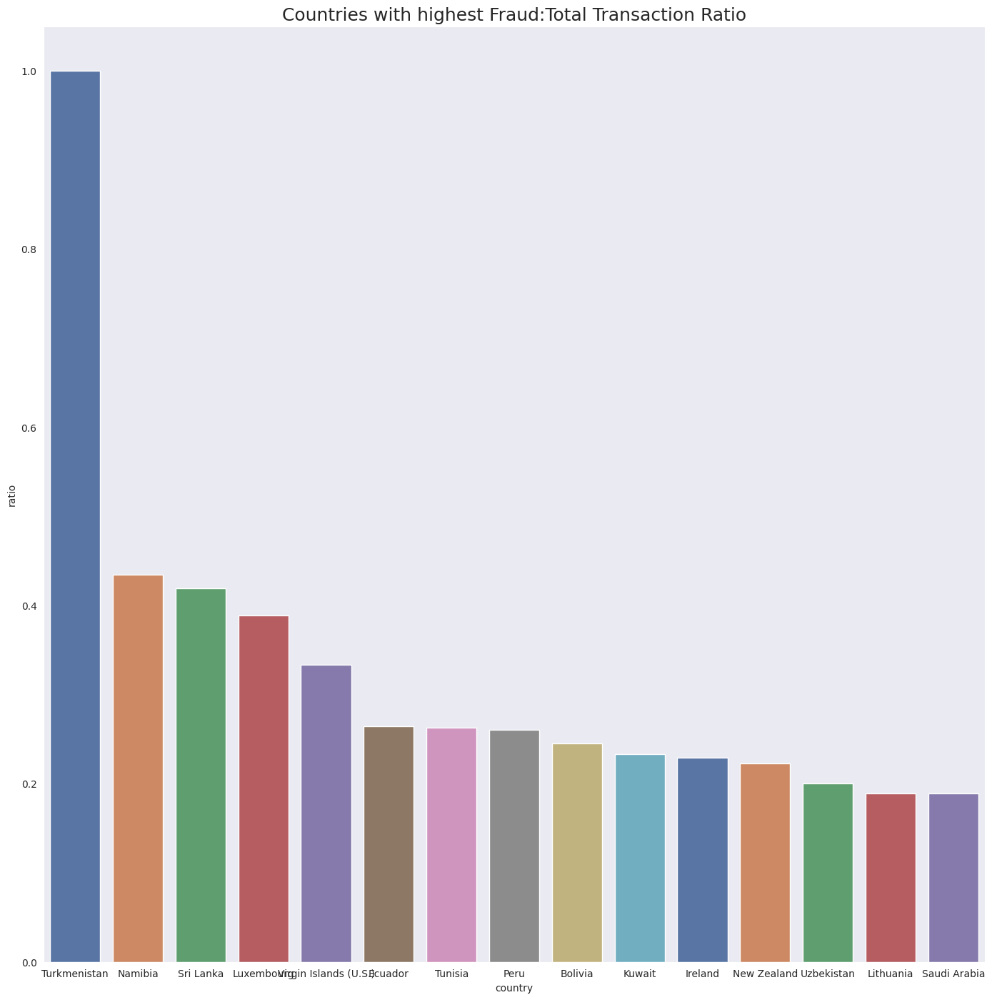

In [48]:
plt.figure(figsize=(17, 17))
ax = sns.barplot(x=rate_df3['country'].head(15), y=rate_df3['ratio'].head(15),palette="deep")
ax.set_title("Countries with highest Fraud:Total Transaction Ratio", fontsize=18)
plt.show()

In [50]:
rate_df4 = rate_df2.sort_values('total_fraudulent',ascending=False).head(20)

<ipython-input-53-8fda7b5a59fd>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Text(0.5, 1.0, 'Countries with highest Fraud')

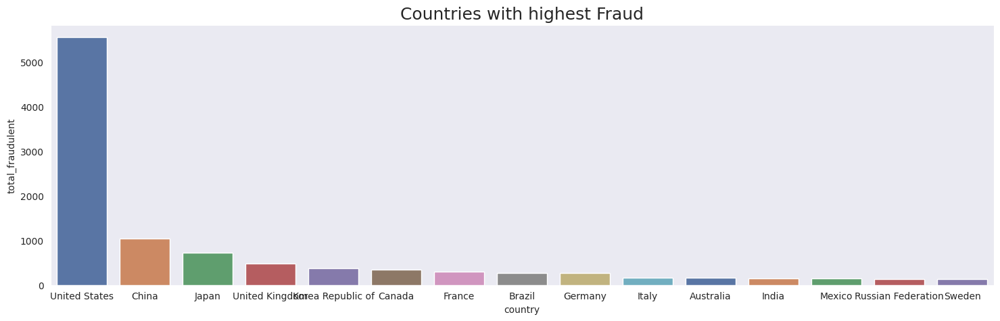

In [53]:
plt.figure(figsize=(18,5))
ax = sns.barplot(x=rate_df4['country'].head(15),y=rate_df4['total_fraudulent'].head(15),palette="deep")
ax.set_title("Countries with highest Fraud",fontsize=18)

# Data Encoding

In [55]:
fraud = pd.read_csv('/content/fraud_w_country.csv')

In [56]:
fraud.head()

,Unnamed: 0,user_id,signup_time,purchase_time,purchase_value,device_id,source,browser,sex,age,ip_address,class,country
0,0,22058,2015-02-24 22:55:49,2015-04-18 02:47:11,34,QVPSPJUOCKZAR,SEO,Chrome,M,39,7.327584e+08,0,Japan
1,1,333320,2015-06-07 20:39:50,2015-06-08 01:38:54,16,EOGFQPIZPYXFZ,Ads,Chrome,F,53,3.503114e+08,0,United States
2,2,1359,2015-01-01 18:52:44,2015-01-01 18:52:45,15,YSSKYOSJHPPLJ,SEO,Opera,M,53,2.621474e+09,1,United States
3,3,150084,2015-04-28 21:13:25,2015-05-04 13:54:50,44,ATGTXKYKUDUQN,SEO,Safari,M,41,3.840542e+09,0,NaN
4,4,221365,2015-07-21 07:09:52,2015-09-09 18:40:53,39,NAUITBZFJKHWW,Ads,Safari,M,45,4.155831e+08,0,United States


In [57]:
source_features = {'SEO':0,'Ads':1,'Direct':2}
fraud.source = fraud.source.replace(source_features)

In [58]:
browser_features = {'Chrome':0,'Opera':1,'Safari':2,'IE':3,'FireFox':4}
fraud.browser = fraud.browser.replace(browser_features)

In [59]:
sex_features = {'M':1,'F':0}
fraud.sex = fraud.sex.replace(sex_features)

In [61]:
fraud2 = fraud.copy()

In [62]:
fraud2.head()

,Unnamed: 0,user_id,signup_time,purchase_time,purchase_value,device_id,source,browser,sex,age,ip_address,class,country
0,0,22058,2015-02-24 22:55:49,2015-04-18 02:47:11,34,QVPSPJUOCKZAR,0,0,1,39,7.327584e+08,0,Japan
1,1,333320,2015-06-07 20:39:50,2015-06-08 01:38:54,16,EOGFQPIZPYXFZ,1,0,0,53,3.503114e+08,0,United States
2,2,1359,2015-01-01 18:52:44,2015-01-01 18:52:45,15,YSSKYOSJHPPLJ,0,1,1,53,2.621474e+09,1,United States
3,3,150084,2015-04-28 21:13:25,2015-05-04 13:54:50,44,ATGTXKYKUDUQN,0,2,1,41,3.840542e+09,0,NaN
4,4,221365,2015-07-21 07:09:52,2015-09-09 18:40:53,39,NAUITBZFJKHWW,1,2,1,45,4.155831e+08,0,United States


In [63]:
labels = fraud2['country'].astype('category').cat.categories.tolist()
replace_map = {'country' : {k: v for k,v in zip(labels,list(range(1,len(labels)+1)))}}

In [64]:
#replace country names with numerical values
fraud2.replace(replace_map,inplace=True)
#Fill NaNs with zero
fraud2['country'].fillna(0,inplace=True)

In [65]:
fraud2.head()

,Unnamed: 0,user_id,signup_time,purchase_time,purchase_value,device_id,source,browser,sex,age,ip_address,class,country
0,0,22058,2015-02-24 22:55:49,2015-04-18 02:47:11,34,QVPSPJUOCKZAR,0,0,1,39,7.327584e+08,0,85.0
1,1,333320,2015-06-07 20:39:50,2015-06-08 01:38:54,16,EOGFQPIZPYXFZ,1,0,0,53,3.503114e+08,0,172.0
2,2,1359,2015-01-01 18:52:44,2015-01-01 18:52:45,15,YSSKYOSJHPPLJ,0,1,1,53,2.621474e+09,1,172.0
3,3,150084,2015-04-28 21:13:25,2015-05-04 13:54:50,44,ATGTXKYKUDUQN,0,2,1,41,3.840542e+09,0,0.0
4,4,221365,2015-07-21 07:09:52,2015-09-09 18:40:53,39,NAUITBZFJKHWW,1,2,1,45,4.155831e+08,0,172.0


# UnderSampling majority class

In [66]:
from random import random

In [67]:
no_frauds = len(fraud2[fraud2['class'] == 1])
no_fraud_indices = fraud2[fraud2['class'] == 0].index

random_indices = np.random.choice(no_fraud_indices,no_frauds, replace=False)
fraud_indices = fraud2[fraud2['class'] == 1].index

under_sample_indices = np.concatenate([fraud_indices,random_indices])
under_sample = fraud2.loc[under_sample_indices]

In [68]:
under_sample.shape

(28302, 13)

In [69]:
under_sample.head()

,Unnamed: 0,user_id,signup_time,purchase_time,purchase_value,device_id,source,browser,sex,age,ip_address,class,country
2,2,1359,2015-01-01 18:52:44,2015-01-01 18:52:45,15,YSSKYOSJHPPLJ,0,1,1,53,2.621474e+09,1,172.0
24,24,171711,2015-01-11 01:51:15,2015-01-11 01:51:16,52,YPLQGKBAAULUV,2,3,0,35,1.120619e+09,1,172.0
25,25,59780,2015-01-04 22:32:33,2015-01-16 01:13:43,31,WUMOBGUCBOXPO,0,4,1,36,1.752167e+09,1,172.0
29,29,151705,2015-01-07 03:44:53,2015-01-07 03:44:54,48,URHCRIXOMLJMH,0,0,0,27,2.836025e+09,1,172.0
59,59,345865,2015-02-01 05:59:23,2015-02-20 08:09:10,36,FKQPZUELCRKBL,0,3,1,30,2.740590e+09,1,61.0


<ipython-input-72-89b628904ff1>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




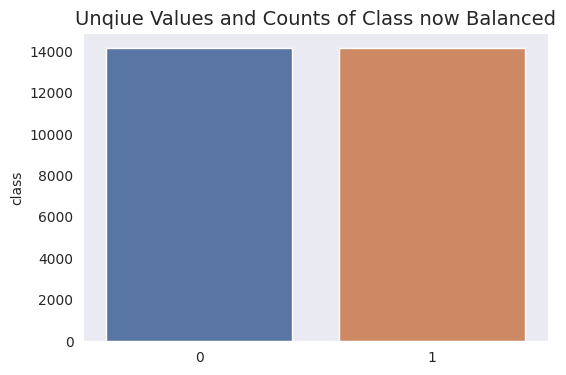

In [72]:
plt.figure(figsize=(6,4))
ax = sns.barplot(x= under_sample['class'].unique(),y=under_sample['class'].value_counts(),palette = "deep")
ax.set_title("Unqiue Values and Counts of Class now Balanced",fontsize=14);

# Exploratorty Data Analysis

Data Description

time related features use GMT time;

purchase_value is in USD;

device_id is unique by device;

In [73]:
fraud['n_country_shared'] = fraud.country.map(fraud.country.value_counts(dropna=False))#lots of NAs in country column, #without dropna=False will produce nan in this col
threshold = 1000
index = fraud['n_country_shared']<threshold
fraud.loc[index,['country']]='Others'

<ipython-input-75-3ef4b6a44bd4>:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




<Figure size 640x480 with 0 Axes>

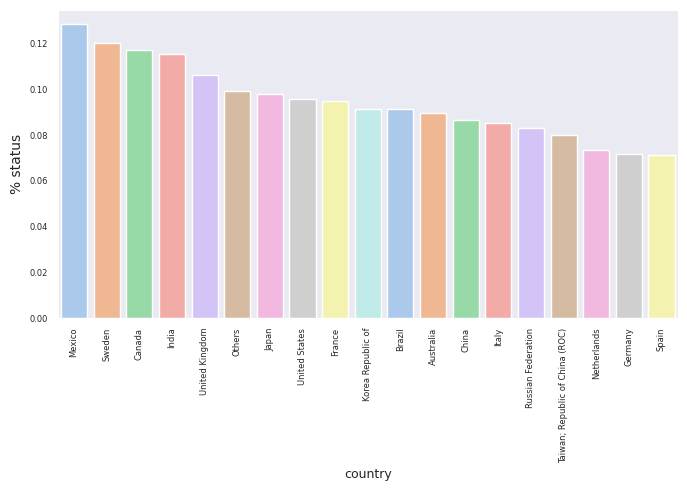

In [75]:
plt.figure()
sns.set_palette("Blues_r")
fig, ax = plt.subplots(figsize=(8,4))
cat_perc = fraud[['country', 'class']].groupby(['country'],as_index=False).mean()
cat_perc.sort_values(by='class',ascending=False,inplace=True)

sns.barplot(ax=ax, x='country', y='class', data=cat_perc, order=cat_perc['country'],palette = "pastel")

plt.ylabel('% status', fontsize=10)
plt.xlabel('country', fontsize=9)
plt.xticks(rotation=90)
plt.tick_params(axis='both', which='major', labelsize=6)
plt.show();

country wise risk

In [76]:
fraud_rate_country = fraud.groupby('country')['class'].value_counts(normalize=True).loc[:,1].sort_values(ascending=False)
def state_risk_classifier(v):
    global highrisk_country, mediumrisk_country, lowrisk_country
    highrisk_country=[]
    mediumrisk_country=[]
    lowrisk_country=[]

    for country in v.index:
        if v[country]>0.012:
            highrisk_country.append(country)
        elif v[country]<0.008:
            lowrisk_country.append(country)
        else:
            mediumrisk_country.append(country)

    print('countries with high risk:', highrisk_country)
    print('countries with medium risk:', mediumrisk_country)
    print('countries with low risk:',lowrisk_country)

state_risk_classifier(fraud_rate_country)

countries with high risk: ['Mexico', 'Sweden', 'Canada', 'India', 'United Kingdom', 'Others', 'Japan', 'United States', 'France', 'Korea Republic of', 'Brazil', 'Australia', 'China', 'Italy', 'Russian Federation', 'Taiwan; Republic of China (ROC)', 'Netherlands', 'Germany', 'Spain']
countries with medium risk: []
countries with low risk: []


# Train test Split

In [78]:
features=['user_id','purchase_value','source','browser','sex','age','country']

In [79]:
x = under_sample[features]
y = under_sample['class']

In [81]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.3, stratify=y)

# Machine learning models

Random Forest Classifier

In [84]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

rf_classifier = RandomForestClassifier(n_estimators=10, random_state=42)
rf_classifier.fit(x_train, y_train)

# Make predictions on the test set
y_pred = rf_classifier.predict(x_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

# Print the results
print(f"Accuracy: {accuracy:.2f}")
print("\nConfusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(classification_rep)


print("Precision:",precision_score(y_test,y_pred))
print("Recall",recall_score(y_test,y_pred))
print("Fl-Score",f1_score(y_test,y_pred))

Accuracy: 0.67

Confusion Matrix:
[[3121 1124]
 [1642 2604]]

Classification Report:
              precision    recall  f1-score   support

           0       0.66      0.74      0.69      4245
           1       0.70      0.61      0.65      4246

    accuracy                           0.67      8491
   macro avg       0.68      0.67      0.67      8491
weighted avg       0.68      0.67      0.67      8491

Precision: 0.6984978540772532
Recall 0.6132830899670277
Fl-Score 0.6531226486079759


KNN Model

In [88]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
x_train_sc= ss.fit_transform(x_train)
x_test_sc = ss.transform(x_test)
#Baseline with faults on undersampled data:
knn = KNeighborsClassifier()
knn.fit(x_train_sc,y_train)
knn_preds = knn.predict(x_test_sc)
print("Precision:",precision_score(y_test,knn_preds))
print("Recall",recall_score(y_test,knn_preds))
print("Fl-Score",f1_score(y_test,knn_preds))
accuracy = accuracy_score(y_test, knn_preds)
print("Accuracy score is ",accuracy)

Precision: 0.5836674403882676
Recall 0.6514366462552991
Fl-Score 0.6156928213689482
Accuracy score is  0.5933341184783889


Bernoulli Naive Bayes

In [91]:
bernoulli_nb_classifier = BernoulliNB()

# Train the model
bernoulli_nb_classifier.fit(x_train, y_train)

# Make predictions on the test set
y_pred = bernoulli_nb_classifier.predict(x_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

# Print the results
print(f"Accuracy: {accuracy:.2f}")
print("\nConfusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(classification_rep)


Accuracy: 0.52

Confusion Matrix:
[[1949 2296]
 [1821 2425]]

Classification Report:
              precision    recall  f1-score   support

           0       0.52      0.46      0.49      4245
           1       0.51      0.57      0.54      4246

    accuracy                           0.52      8491
   macro avg       0.52      0.52      0.51      8491
weighted avg       0.52      0.52      0.51      8491



# Model Evaluation

The best model implemented is RandomForestClassifier

In [96]:
rf = RandomForestClassifier(n_estimators=100,max_depth=30,min_samples_split=5)
rf.fit(x_train,y_train)
rf_preds= rf.predict(x_test)
#after manually tuning the parameters
print("RF with 100 estimators, max_depth=30, min_sample_split=5")
print("Precision:",precision_score(y_test,rf_preds))
print("Recall",recall_score(y_test,rf_preds))
print("Fl-Score",f1_score(y_test,rf_preds))
accuracy = accuracy_score(y_test,rf_preds)
print("Accuracy Score is:",accuracy)

RF with 100 estimators, max_depth=30, min_sample_split=5
Precision: 0.7029780564263323
Recall 0.6337729627885068
Fl-Score 0.6665840971018082
Accuracy Score is: 0.6829584265693087


RandomForest Confusion Matrix

In [97]:
def gen_cmat(model,x_text,y_test):
    y_preds=model.predict(x_test)
    cmat = confusion_matrix(y_test,y_preds)
    #confusion matric df
    cmat_df = pd.DataFrame(cmat, columns=['Pred No-Fraud','Pred Fraud'],
                           index = ['Actual No-Fraud','Actual Fraud'])
    return cmat_df

In [99]:
gen_cmat(rf,x_test,y_test)

,Pred No-Fraud,Pred Fraud
Actual No-Fraud,3108,1137
Actual Fraud,1555,2691


Summary:

The main motive of this analysis is to create a fraud-detection algorithm to flag a transaction as legitimate or fraudulent considering a huge dataset.

1. For each user, i have determined their country based on their numeric ip address.
2. Model Evaluation: RandomForestClassifier is the best model with an accuracy of 68.2% after manually tuning the parametres.
3. We have unbalanced classes (only 10% of the data has fradulent transactions) which will lead to the model being a biased model hence undersampling to balance the classes is used.
4. Age has a similar distribution for both fraudlent and legitimate classes.
5. While the United States has the highest count of total fraudulent transactions, it also has the highest sample size of transactions (resulting in a fraudulent transaction raito of 9.5%)